The goal of this Project is to visualize Toxic releases in pensylvannia

In [14]:
import folium
from folium import Marker, GeoJson
from folium.plugins import HeatMap
import matplotlib.pyplot as plt

import pandas as pd
import geopandas as gpd

from shapely.ops import nearest_points
from shapely.geometry import LineString

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

In [2]:
# reading the data
toxic_df = gpd.read_file("toxic_release_pennsylvania.shp") 
print(toxic_df.shape) # check Number of rows and columns
toxic_df.head()

(4663, 10)


,YEAR,CITY,COUNTY,ST,LATITUDE,LONGITUDE,CHEMICAL,UNIT_OF_ME,TOTAL_RELE,geometry
0,2016,PHILADELPHIA,PHILADELPHIA,PA,40.005901,-75.072103,FORMIC ACID,Pounds,0.160,POINT (2718560.227 256380.179)
1,2016,PHILADELPHIA,PHILADELPHIA,PA,39.920120,-75.146410,ETHYLENE GLYCOL,Pounds,13353.480,POINT (2698674.606 224522.905)
2,2016,PHILADELPHIA,PHILADELPHIA,PA,40.023880,-75.220450,CERTAIN GLYCOL ETHERS,Pounds,104.135,POINT (2676833.394 261701.856)
3,2016,PHILADELPHIA,PHILADELPHIA,PA,39.913540,-75.198890,LEAD COMPOUNDS,Pounds,1730.280,POINT (2684030.004 221697.388)
4,2016,PHILADELPHIA,PHILADELPHIA,PA,39.913540,-75.198890,BENZENE,Pounds,39863.290,POINT (2684030.004 221697.388)


In [3]:
 # Reading the data
air_monitor = gpd.read_file("PhillyHealth_Air_Monitoring_Stations.shp")
print(air_monitor.shape)
air_monitor.head()

(12, 24)


,SITE_NAME,ADDRESS,BLACK_CARB,ULTRAFINE_,CO,SO2,OZONE,NO2,NOY_NO,PM10,PM2_5,SPECIATED_,PM_COURSE,CARBONYLS,PAMS_VOC,TSP_11101,TSP_METALS,TSP_LEAD,TOXICS_TO1,MET,COMMUNITY_,LATITUDE,LONGITUDE,geometry
0,LAB,1501 East Lycoming Avenue,N,N,Y,N,Y,Y,Y,N,Y,N,N,Y,Y,N,Y,N,y,N,N,40.008606,-75.097624,POINT (2711384.641 257149.310)
1,ROX,Eva and Dearnley Streets,N,N,N,N,N,N,N,N,N,N,N,Y,N,N,Y,N,Y,N,N,40.050461,-75.236966,POINT (2671934.290 271248.900)
2,NEA,Grant Avenue and Ashton Street,N,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,N,40.072073,-75.013128,POINT (2734326.638 280980.247)
3,CHS,500 South Broad Street,N,N,N,N,N,N,N,N,N,N,N,Y,N,N,Y,N,Y,N,N,39.944510,-75.165442,POINT (2693078.580 233247.101)
4,NEW,2861 Lewis Street,N,N,Y,Y,Y,N,Y,Y,Y,Y,Y,N,N,Y,N,Y,N,Y,N,39.991688,-75.080378,POINT (2716399.773 251134.976)


In [27]:
toxic_df.CHEMICAL.value_counts()

TOLUENE                                                                   234
XYLENE (MIXED ISOMERS)                                                    227
CERTAIN GLYCOL ETHERS                                                     214
AMMONIA                                                                   189
METHANOL                                                                  153
ETHYLBENZENE                                                              139
METHYL ETHYL KETONE                                                       130
SULFURIC ACID (1994 AND AFTER ACID AEROSOLS" ONLY)"                       130
STYRENE                                                                   120
COPPER                                                                    117
LEAD                                                                      110
ETHYLENE GLYCOL                                                           108
ZINC COMPOUNDS                                                  

In [29]:
toxic_df.COUNTY.value_counts()

PHILADELPHIA    4663
Name: COUNTY, dtype: int64

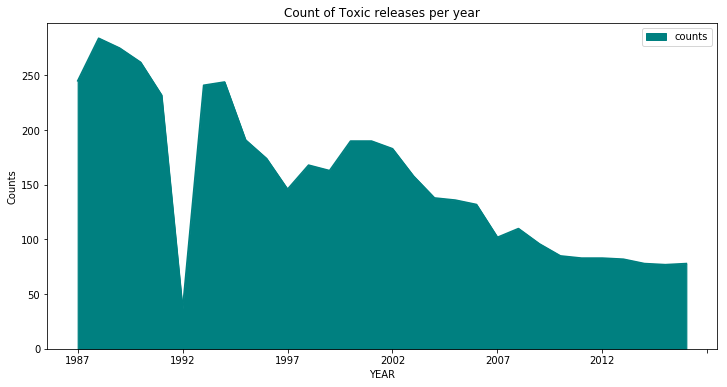

In [40]:
# Checking the totalreleases over the years
toxic_df.YEAR.value_counts().reset_index().rename({'YEAR':'counts','index':'YEAR'}, axis=1).sort_values('YEAR').plot(kind = 'area',x = 'YEAR', y = 'counts', color = 'teal')
plt.rcParams["figure.figsize"] = (8,6)
plt.title('Count of Toxic releases per year')
plt.ylabel('Counts')
plt.show()


In [105]:
# Co-ordinate reference system of two dataframes
print(toxic_df.crs)
print(air_monitor.crs)

epsg:2272
epsg:2272


In [49]:

# Function for creating a map
def plot_folium_map(df_plot,feature,filename):
    m_1 = folium.Map(location=[39.9526,-75.1652], tiles='openstreetmap', zoom_start=11)

    # Adding points to the map
    for idx, row in df_plot.iterrows():
        Marker([row['LATITUDE'], row['LONGITUDE']], popup=row[feature]).add_to(m_1)
        
    m_1.save(filename)
    return m_1


In [50]:
plot_folium_map(toxic_df,'TOTAL_RELE','Toxic_Chemicals_open_street_view.html')

In [51]:
m_2 = folium.Map(location=[39.9526,-75.1652], tiles='openstreetmap', zoom_start=10)

# Add a heatmap to the base map
HeatMap(data = toxic_df[['LATITUDE', 'LONGITUDE']], radius=10).add_to(m_2)

m_2.save('Toxic_Chemicals_heatMap.html')
# Display the map
m_2

In [53]:
plot_folium_map(air_monitor,'SITE_NAME','Air_monitoring_stations_map.html')

In [55]:
# Using buffer to identofy areas within the particular distance range
two_mile_buffer = air_monitor.geometry.buffer(2*5280)
#two_mile_buffer.head()

In [56]:
# Create map with release incidents and monitoring stations
m = folium.Map(location=[39.9526,-75.1652], zoom_start=11)
HeatMap(data=toxic_df[['LATITUDE', 'LONGITUDE']], radius=15).add_to(m)
for idx, row in air_monitor.iterrows():
    Marker([row['LATITUDE'], row['LONGITUDE']]).add_to(m)
    
# Plot each polygon on the map
GeoJson(two_mile_buffer.to_crs(epsg=4326)).add_to(m)
m.save('Two_miles_buffer_map.html')
# Show the map
m

# Determine which station is near to any given point

In [61]:
from shapely.geometry import Point, Polygon, MultiPolygon 
air_monitor['geometry1'] = air_monitor.apply(lambda row: Point( row.LONGITUDE, row.LATITUDE), axis=1) 
toxic_df['geometry1'] = toxic_df.apply(lambda row: Point(row.LONGITUDE, row.LATITUDE), axis=1)
air_monitor['geometry1'] = air_monitor['geometry1'].astype('geometry')
toxic_df['geometry1'] = toxic_df['geometry1'].astype('geometry')

In [62]:
toxic_df.geometry1.isna().sum()

0

In [58]:
m = folium.Map(location=[39.9526,-75.1652], tiles='cartodbpositron', zoom_start=11)

# Adding points to the map
for idx, row in toxic_df.iterrows():
    folium.CircleMarker([row['LATITUDE'], row['LONGITUDE']],color= 'red',   radius=2).add_to(m)
    
for idx, row in air_monitor.iterrows():
    Marker([row['LATITUDE'], row['LONGITUDE']]).add_to(m)

m.save('Map_with_chemicalsReleasedAreas_AirMonitoringStations.html')
m


In [63]:
def calculate_nearest(row, destination, val, col='geometry1'):
   
    dest_unary = destination['geometry1'].unary_union
   
    nearest_geom = nearest_points(row[col], dest_unary)
   
    match_geom = destination.loc[destination.geometry1 == nearest_geom[1]]
   
    match_value = match_geom[val].to_numpy()[0]
    return match_value

In [64]:
# Get the nearest geometry
toxic_df['nearest_geom'] = toxic_df.apply(calculate_nearest, destination= air_monitor, val='geometry1', axis=1)
# Get the nearest Air Station station name
toxic_df['nearest_station'] = toxic_df.apply(calculate_nearest, destination=air_monitor, val='SITE_NAME', axis=1)
toxic_df.head()

,YEAR,CITY,COUNTY,ST,LATITUDE,LONGITUDE,CHEMICAL,UNIT_OF_ME,TOTAL_RELE,geometry,geometry1,nearest_geom,nearest_station
0,2016,PHILADELPHIA,PHILADELPHIA,PA,40.005901,-75.072103,FORMIC ACID,Pounds,0.160,POINT (2718560.227 256380.179),POINT (-75.07210 40.00590),POINT (-75.08037756861422 39.99168841302326),NEW
1,2016,PHILADELPHIA,PHILADELPHIA,PA,39.920120,-75.146410,ETHYLENE GLYCOL,Pounds,13353.480,POINT (2698674.606 224522.905),POINT (-75.14641 39.92012),POINT (-75.16544220711933 39.94450986737153),CHS
2,2016,PHILADELPHIA,PHILADELPHIA,PA,40.023880,-75.220450,CERTAIN GLYCOL ETHERS,Pounds,104.135,POINT (2676833.394 261701.856),POINT (-75.22045 40.02388),POINT (-75.23696593217323 40.05046098234158),ROX
3,2016,PHILADELPHIA,PHILADELPHIA,PA,39.913540,-75.198890,LEAD COMPOUNDS,Pounds,1730.280,POINT (2684030.004 221697.388),POINT (-75.19889 39.91354),POINT (-75.18544797349526 39.91278992561834),PHA
4,2016,PHILADELPHIA,PHILADELPHIA,PA,39.913540,-75.198890,BENZENE,Pounds,39863.290,POINT (2684030.004 221697.388),POINT (-75.19889 39.91354),POINT (-75.18544797349526 39.91278992561834),PHA


In [65]:
toxic_df['line'] = toxic_df.apply(lambda row: LineString([row['geometry1'], row['nearest_geom']]), axis=1)
toxic_df.head()

,YEAR,CITY,COUNTY,ST,LATITUDE,LONGITUDE,CHEMICAL,UNIT_OF_ME,TOTAL_RELE,geometry,geometry1,nearest_geom,nearest_station,line
0,2016,PHILADELPHIA,PHILADELPHIA,PA,40.005901,-75.072103,FORMIC ACID,Pounds,0.160,POINT (2718560.227 256380.179),POINT (-75.07210 40.00590),POINT (-75.08037756861422 39.99168841302326),NEW,"LINESTRING (-75.072103 40.005901, -75.08037756861422 39.99168841302326)"
1,2016,PHILADELPHIA,PHILADELPHIA,PA,39.920120,-75.146410,ETHYLENE GLYCOL,Pounds,13353.480,POINT (2698674.606 224522.905),POINT (-75.14641 39.92012),POINT (-75.16544220711933 39.94450986737153),CHS,"LINESTRING (-75.14641 39.92012, -75.16544220711933 39.94450986737153)"
2,2016,PHILADELPHIA,PHILADELPHIA,PA,40.023880,-75.220450,CERTAIN GLYCOL ETHERS,Pounds,104.135,POINT (2676833.394 261701.856),POINT (-75.22045 40.02388),POINT (-75.23696593217323 40.05046098234158),ROX,"LINESTRING (-75.22045 40.02388, -75.23696593217323 40.05046098234158)"
3,2016,PHILADELPHIA,PHILADELPHIA,PA,39.913540,-75.198890,LEAD COMPOUNDS,Pounds,1730.280,POINT (2684030.004 221697.388),POINT (-75.19889 39.91354),POINT (-75.18544797349526 39.91278992561834),PHA,"LINESTRING (-75.19889000000001 39.91354, -75.18544797349526 39.91278992561834)"
4,2016,PHILADELPHIA,PHILADELPHIA,PA,39.913540,-75.198890,BENZENE,Pounds,39863.290,POINT (2684030.004 221697.388),POINT (-75.19889 39.91354),POINT (-75.18544797349526 39.91278992561834),PHA,"LINESTRING (-75.19889000000001 39.91354, -75.18544797349526 39.91278992561834)"


In [66]:
toxic_df_line = toxic_df[[ "nearest_station", "line"]].set_geometry('line')

In [67]:
print(toxic_df_line.shape)
toxic_df_line.head(1)

(4663, 2)


,nearest_station,line
0,NEW,"LINESTRING (-75.07210 40.00590, -75.08038 39.99169)"


In [72]:
toxic_df_line.crs = crs={"init":"epsg:4326"}

/Users/sn494x/anaconda3/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [69]:
toxic_df.drop(["nearest_geom", "line"], axis=1, inplace=True)
toxic_df.head(1)

,YEAR,CITY,COUNTY,ST,LATITUDE,LONGITUDE,CHEMICAL,UNIT_OF_ME,TOTAL_RELE,geometry,geometry1,nearest_station
0,2016,PHILADELPHIA,PHILADELPHIA,PA,40.005901,-75.072103,FORMIC ACID,Pounds,0.16,POINT (2718560.227 256380.179),POINT (-75.07210 40.00590),NEW


In [74]:

m = folium.Map([39.9526,-75.1652],
               zoom_start = 12, 
               tiles="cartodbpositron")

for idx, row in toxic_df.iterrows():
    folium.CircleMarker([row['LATITUDE'], row['LONGITUDE']], color="red", radius=4).add_to(m)
for idx, row in air_monitor.iterrows():
    Marker([row['LATITUDE'], row['LONGITUDE']]).add_to(m)

m.save('Nearest_Station_for_every_point.html')
GeoJson(toxic_df_line.to_crs(epsg=4326)).add_to(m)

m